In [1]:
import matplotlib.pyplot as plt
import numpy as np
import cv2
import pandas as pd
from mammo_dataset import MammoDataset, DatasetEnum, Split, ReturnMode, ConvertTo
from unified_dataset import UnifiedDataset
from utils.preprocess import resize_img
from windowing.calculate import calculate_a_b
from windowing.apply import window
from utils.show import *

The history saving thread hit an unexpected error (DatabaseError('database disk image is malformed')).History will not be written to the database.


Dataset vindr initialized with 10000 rows.


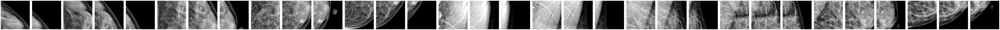

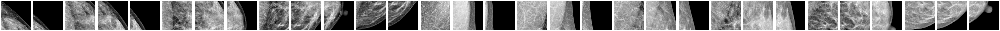

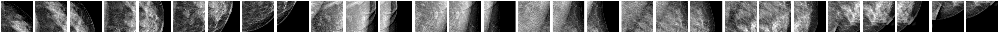


KeyboardInterrupt



In [2]:
dataset = MammoDataset(DatasetEnum.VINDR, Split.ALL, ReturnMode.BREAST_TILES_LABEL, ConvertTo.UINT8, read_window=True)
for images, tiles, labels in dataset:
    show_in_a_row([images])


In [ ]:
from torch.utils.data import IterableDataset, DataLoader, get_worker_info

class BatchDataset(IterableDataset):
    def __init__(self, dataset, batch_size):
        
        if dataset.return_mode != ReturnMode.BREAST_TILES_LABEL:
            raise NotImplementedError("Cannot load this return mode in batces yet.")
        
        self.dataset = dataset
        self.batch_size = batch_size
        self.total_samples = len(dataset)

    def __iter__(self):
        worker_info = get_worker_info()
        if worker_info is None:
            iter_start = 0
            iter_stride = 1
        else:
            iter_start = worker_info.id
            iter_stride = worker_info.num_workers

        batch_images = []
        batch_i = []
        batch_labels = []

        for i in range(iter_start, self.total_samples, iter_stride):
            images, tiles, label = self.dataset[i]

            batch_images.extend(images)
            batch_i.extend([i] * len(images))
            batch_labels.extend([label] * len(images))

            while len(batch_images) >= self.batch_size:
                yield (
                    batch_images[:self.batch_size],
                    batch_i[:self.batch_size],
                    batch_labels[:self.batch_size]
                )
                batch_images = batch_images[self.batch_size:]
                batch_i = batch_i[self.batch_size:]
                batch_labels = batch_labels[self.batch_size:]

        if batch_images:
            yield batch_images, batch_i, batch_labels


In [ ]:
# dataset = MammoDataset(DatasetEnum.CSAW, Split.TRAIN, ReturnMode.IMAGE_LABEL, ConvertTo.RGB_TENSOR_IMGNET_NORM)
dataset = MammoDataset(DatasetEnum.CSAW, Split.TRAIN, ReturnMode.BREAST_TILES_LABEL, ConvertTo.UINT8, labels=1, tile_size=518)

import time
    
dataloader = _get_dataloader(dataset, batch_size=4, num_workers=12)

for batch_images, batch_i, batch_labels in dataloader:
    print(len(batch_images), batch_i, batch_labels)
    


# for i, (images, tiles, label) in enumerate(dataset):
#     print(len(images), len(tiles))
    
    
    
#print(dataset.df[dataset.ds_spec.view_col].value_counts())
# print(dataset.df['CC'].value_counts())

# embedding_inference = EmbeddingInference(dataset)

In [ ]:

# ssl_dataset = UnifiedDataset((MammoDataset(DatasetEnum.EMBED, Split.TRAIN, return_mode=ReturnMode.IMAGE_ONLY),
#                               MammoDataset(DatasetEnum.EMBED, Split.VALID, return_mode=ReturnMode.IMAGE_ONLY),
#                               MammoDataset(DatasetEnum.VINDR, Split.ALL, return_mode=ReturnMode.IMAGE_ONLY),
#                               MammoDataset(DatasetEnum.RSNA, Split.ALL, return_mode=ReturnMode.IMAGE_ONLY),
#                               MammoDataset(DatasetEnum.CSAW, Split.ALL, return_mode=ReturnMode.IMAGE_ONLY)))

# train_dataset = UnifiedDataset((MammoDataset(DatasetEnum.EMBED, Split.TRAIN, labels=[4, 5, 6], return_mode=ReturnMode.CC_MLO_TILES_LABEL),
#                                 MammoDataset(DatasetEnum.VINDR, Split.TRAIN, labels=['BI-RADS 4', 'BI-RADS 5', 'BI-RADS 6'], return_mode=ReturnMode.CC_MLO_TILES_LABEL),
#                                 MammoDataset(DatasetEnum.RSNA, Split.TRAIN, labels=1, return_mode=ReturnMode.CC_MLO_TILES_LABEL),
#                                 MammoDataset(DatasetEnum.CSAW, Split.TRAIN, labels=1, return_mode=ReturnMode.CC_MLO_TILES_LABEL)))

# valid_dataset = UnifiedDataset((MammoDataset(DatasetEnum.EMBED, Split.VALID, labels=[4, 5, 6], return_mode=ReturnMode.CC_MLO_TILES_LABEL),
#                                 MammoDataset(DatasetEnum.VINDR, Split.VALID, labels=['BI-RADS 4', 'BI-RADS 5', 'BI-RADS 6'], return_mode=ReturnMode.CC_MLO_TILES_LABEL),
#                                 MammoDataset(DatasetEnum.RSNA, Split.VALID, labels=1, return_mode=ReturnMode.CC_MLO_TILES_LABEL),
#                                 MammoDataset(DatasetEnum.CSAW, Split.VALID, labels=1, return_mode=ReturnMode.CC_MLO_TILES_LABEL)))

# test_dataset = UnifiedDataset((MammoDataset(DatasetEnum.EMBED, Split.TEST, labels=[4, 5, 6], return_mode=ReturnMode.CC_MLO_TILES_LABEL),
#                                 MammoDataset(DatasetEnum.VINDR, Split.TEST, labels=['BI-RADS 4', 'BI-RADS 5', 'BI-RADS 6'], return_mode=ReturnMode.CC_MLO_TILES_LABEL),
#                                 MammoDataset(DatasetEnum.RSNA, Split.TEST, labels=1, return_mode=ReturnMode.CC_MLO_TILES_LABEL),
#                                 MammoDataset(DatasetEnum.CSAW, Split.TEST, labels=1, return_mode=ReturnMode.CC_MLO_TILES_LABEL)))
# for cc, mlo, tiles, label in dataset:
#     print(label)
#     show_mammo(cc, mlo, tiles)

In [ ]:
dataset = MammoDataset(DatasetEnum.EMBED, Split.TRAIN, return_mode=ReturnMode.RAW_NUMPY)

for i in dataset:
    print(i.max())

# df = pd.read_csv(dataset.csv_path)

# for idx, image in dataset:
#     print(df.iloc[idx][dataset.ds_spec.label_col])
    
# def add_windowing_columns(dataset):
#     df = pd.read_csv(dataset.csv_path)
#     num_samples = len(df)
#     df['windowing_a'] = np.random.uniform(0, 1, size=num_samples)
#     df['windowing_b'] = np.random.uniform(0, 1, size=num_samples)
#     df.to_csv(dataset.csv_path, index=False)
#     return df

# add_windowing_columns(dataset)
    